youtube 이수안 컴퓨터
XGBoost, LightGBM

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
#from sklearn import datasets
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.metrics import accuracy_score, precision_score,recall_score

import xgboost as xgb
from xgboost import XGBRFClassifier,XGBRFRegressor
from xgboost import plot_importance, plot_tree

import graphviz
import matplotlib.pyplot as plt
plt.style.use(['seaborn-whitegrid'])


In [9]:
import matplotlib.font_manager as fm
font_list=[font.name for font in fm.fontManager.ttflist]
font_list
plt.rcParams['font.family']='NanumGothic'

In [2]:
df=pd.read_csv('revised_final_fire_weather_7yr.csv')

In [3]:
df.columns

Index(['산불발생여부', '발생장소_시도', '관측일', '일최고기온', '일평균현지기압', '일최고현지기압', '일최저현지기압',
       '일평균해면기압', '일최고해면기압', '일최저해면기압', '일평균상대습도', '일최소상대습도', '일평균수증기압',
       '일최고수증기압', '일최저수증기압', '일평균풍속', '일최대풍속', '일최대풍속풍향', '일최대순간풍속',
       '일최대순간풍속풍향', '풍정합', '일강수량', '일평균전운량', '최다운량', '일합계일사량'],
      dtype='object')

In [4]:
#변수지정
# x = df[['평균기온', '일최고기온', '일최고기온시각', '일최저기온',
#        '일최저기온시각', '일평균현지기압', '일평균해면기압', '일최고해면기압', '일최고해면기압시각', '일최저해면기압',
#        '일최저해면기압시각', '일평균상대습도', '일최소상대습도', '일최소상대습도시각', '일평균수증기압', '일최고수증기압',
#        '일최고수증기압시각', '일최저수증기압', '일최저수증기압시각', '일평균풍속', '일최대풍속', '일최대풍속시각',
#        '일최대풍속풍향', '일최대순간풍속', '일최대순간풍속시각', '일최대순간풍속풍향', '풍정합', '일평균전운량',
#        '일평균중하층운량', '최다운량', '최다운량시각', '일합계일조시간', '일합계일사량', '일평균지면온도']]
# x=df[['dayMaxT','dayMinT','dayAvgP','dayAvgPsea','dayMaxPsea','dayMinPsea',
#       'dayAvgRhm','dayMinRhm','dayAvgWaterP','dayMaxWaterP','dayMinWaterP',
#       'dayAvgWS','dayMaxWS','dayMaxWSWD','dayMaxInsWS','dayMaxInsWSWD','dayAvgCloud',
#       'dayAvgMiddleLowCloud','daySumSunRay','dayAvgGroundT']]

#모든 변수를 적용하여 변수중요도 그래프에서 상위 변수들로만 다시 적용(표기가 애매한 시각관련 변수도 제외)
ndf=df[['산불발생여부', '일최고기온', '일평균현지기압', '일최고현지기압', '일최저현지기압',
       '일평균해면기압', '일최고해면기압', '일최저해면기압', '일평균상대습도', '일최소상대습도', '일평균수증기압',
       '일최고수증기압', '일최저수증기압', '일평균풍속', '일최대풍속', '일최대풍속풍향', '일최대순간풍속',
       '일최대순간풍속풍향', '풍정합', '일강수량', '일평균전운량', '최다운량', '일합계일사량']]

c:\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)


c:\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


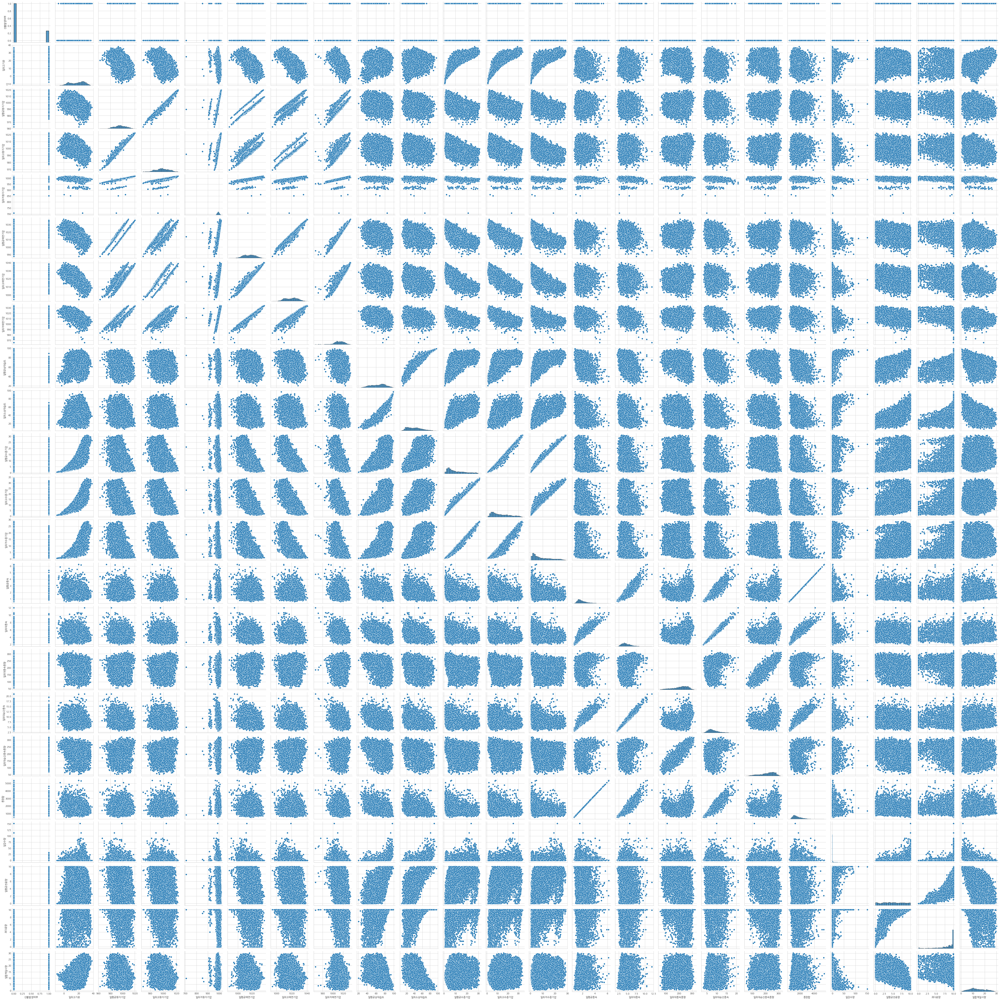

In [10]:
sns.pairplot(ndf)